# Simulation study (Hyperparameter tuning) - Inference of tumour growth model from a group of virtual patients without treatment 

## Build tumour growth model

In [1]:
import erlotinib as erlo

# Define mechanistic model
path = erlo.ModelLibrary().tumour_growth_inhibition_model_koch_reparametrised()
mechanistic_model = erlo.PharmacodynamicModel(path)
mechanistic_model.set_parameter_names(names={
    'myokit.tumour_volume': 'Tumour volume in cm^3',
    'myokit.critical_volume': 'Critical volume in cm^3',
    'myokit.drug_concentration': 'Drug concentration in mg/L',
    'myokit.kappa': 'Potency in L/mg/day',
    'myokit.lambda': 'Exponential growth rate in 1/day'})

# Define error model
error_model = erlo.ConstantAndMultiplicativeGaussianErrorModel()

# Define population model
population_model = [
    erlo.LogNormalModel(),  # Initial tumour volume
    erlo.LogNormalModel(),  # Critical tumour volume
    erlo.LogNormalModel(),  # Tumour growth rate
    erlo.PooledModel(),     # Base noise
    erlo.PooledModel()]     # Relative noise

# Build model
problem = erlo.ProblemModellingController(
    mechanistic_model, error_model)
problem.fix_parameters({
    'Drug concentration in mg/L': 0,
    'Potency in L/mg/day': 0})
problem.set_population_model(population_model)

## Measure tumour volume in a virtual patient

In [2]:
import numpy as np

# Get predictive model
predictive_model = problem.get_predictive_model()

# Define a virtual patient population
parameters = [
    0.13,  # Mean: Initial tumour volume
    0.04,  # Std.: Initial tumour volume
    1.00,  # Mean: Critical tumour volume
    1.43,  # Std.: Critical tumour volume
    0.25,  # Mean: Tumour growth rate
    0.17,  # Std.: Tumour growth rate
    0.04,  # Pooled: Base noise
    0.1]   # Pooled: Relative noise

# Take virtual measurements
seed = 1
times = np.linspace(0, 30, num=100)
n_samples = 8
data = predictive_model.sample(parameters, times, n_samples, seed)

# Create scatter plot
fig = erlo.plots.PDTimeSeriesPlot()
fig.add_data(data, biomarker='myokit.tumour_volume', meas_key='Sample')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')

# Show figure
fig.show()

**Figure 1:** Visualisation of the measured tumour growth in a group of virtual patient.

## Build prior predictive model

### Individual model

In [3]:
import pints

# Define prior distribution
log_priors = [
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=1, a=0, b=np.inf),      # Initial tumour volume
    pints.TruncatedGaussianLogPrior(mean=1, sd=1, a=0, b=np.inf),        # Critical tumour volume
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=1, a=0, b=np.inf),      # Growth rate
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=1, a=0, b=np.inf),      # Sigma base
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=0.1, a=0, b=np.inf)]    # Sigma rel.
log_prior = pints.ComposedLogPrior(*log_priors)

# Define prior predictive model
predictive_model = problem.get_predictive_model(exclude_pop_model=True)
model = erlo.PriorPredictiveModel(predictive_model, log_prior)

# Sample from prior predictive model
seed = 42
n_samples = 1000
times = np.linspace(0, 30)
samples = model.sample(times, n_samples, seed)

# Visualise prior predictive model
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples, bulk_probs=[0.3, 0.6, 0.9])
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

**Figure 2:** Approximate prior predictive model for the tumour growth in an individual over time. The shaded areas indicate the 30%, 60% and 90% bulk of the prior predictive model (from dark to light). The prior predictive model was approximated by sampling 1000 parameters from the prior distribution, and subsequent sampling of 50 equidistant time points from the predictive model each parameter set.

### Population model

In [4]:
# Define prior distribution
log_priors = [
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=1, a=0, b=np.inf),      # Mean Initial tumour volume
    pints.TruncatedGaussianLogPrior(mean=1, sd=1, a=0, b=np.inf),        # Std. Initial tumour volume
    pints.TruncatedGaussianLogPrior(mean=1, sd=1, a=0, b=np.inf),        # Mean Critical tumour volume
    pints.TruncatedGaussianLogPrior(mean=1, sd=1, a=0, b=np.inf),        # Std. Critical tumour volume
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=1, a=0, b=np.inf),      # Mean Growth rate
    pints.TruncatedGaussianLogPrior(mean=1, sd=1, a=0, b=np.inf),        # Std. Growth rate
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=1, a=0, b=np.inf),      # Pooled Sigma base
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=0.1, a=0, b=np.inf)]    # Pooled Sigma rel.
log_prior = pints.ComposedLogPrior(*log_priors)

# Define prior predictive model
predictive_model = problem.get_predictive_model()
model = erlo.PriorPredictiveModel(predictive_model, log_prior)

# Sample from prior predictive model
seed = 42
n_samples = 100
times = np.linspace(0, 30)
samples = model.sample(times, n_samples, seed)

# Visualise prior predictive model
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples, bulk_probs=[0.3, 0.6, 0.9])
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

**Figure 3:** Approximate prior predictive model for the tumour growth in a population over time. The shaded areas indicate the 30%, 60% and 90% bulk of the prior predictive model (from dark to light). The prior predictive model was approximated by sampling 1000 parameters from the prior distribution, and subsequent sampling of 50 equidistant time points from the predictive model for each parameter set.

## Find posterior probability distribution

In [25]:
# Create posterior distribution
problem.set_data(
    data, meas_key='Sample', dose_key=None, dose_duration_key=None)
problem.set_log_prior(log_priors)
log_posterior = problem.get_log_posterior()

# Set up sampling controller
sampler = erlo.SamplingController(log_posterior)
sampler.set_transform(transform=pints.LogTransformation(n_parameters=problem.get_n_parameters()))
sampler.set_n_runs(5)

# Run sampling
posterior_samples = sampler.run(n_iterations=10000, show_progress_bar=True)

In [9]:
posterior_samples.head()

,ID,Parameter,Sample,Iteration,Run
0,ID 1,Tumour volume in cm^3,0.131363,1,1
1,ID 1,Tumour volume in cm^3,0.131363,2,1
2,ID 1,Tumour volume in cm^3,0.131363,3,1
3,ID 1,Tumour volume in cm^3,0.145532,4,1
4,ID 1,Tumour volume in cm^3,0.138466,5,1


In [11]:
import arviz as az

centered = az.load_arviz_data("centered_eight")
centered.posterior

<xarray.Dataset>
Dimensions:  (chain: 4, draw: 500, school: 8)
Coordinates:
  * chain    (chain) int64 0 1 2 3
  * draw     (draw) int64 0 1 2 3 4 5 6 7 8 ... 492 493 494 495 496 497 498 499
  * school   (school) object 'Choate' 'Deerfield' ... "St. Paul's" 'Mt. Hermon'
Data variables:
    mu       (chain, draw) float64 ...
    theta    (chain, draw, school) float64 ...
    tau      (chain, draw) float64 ...
Attributes:
    created_at:                 2019-06-21T17:36:34.398087
    inference_library:          pymc3
    inference_library_version:  3.7

In [22]:
import xarray as xr

def to_xarray_dataset(data):
    """
    Takes a pandas.DataFrame with posterior samples and returns it in form of a xarray.Dataset.
    
    Extends version one to hierarchical modelling results.

    #TODO: Reference dataset is starting to count chains and draws with 0
    """
    # Get number of iterations and number of chains
    draws = data['Iteration'].unique()
    n_draws = len(draws)
    chains = data['Run'].unique()
    n_chains = len(chains)

    # Sort samples of parameters into xarrays
    container = {}
    parameter_names = data['Parameter'].unique()
    for param_id, parameter in enumerate(parameter_names):
        # Mask dataframe for parameter
        mask = data['Parameter'] == parameter
        temp = data[mask]

        # Get the number of individuals for this parameter (population parameters will have ID ``None``)
        ids = temp['ID'].dropna().unique()
        n_ids = len(ids)

        # Sort samples for population parameters
        if n_ids == 0:
            # Create conatiner for samples
            samples = np.empty(shape=(n_chains, n_draws), dtype=float)

            # Fill samples for each chain
            for chain_id, chain in enumerate(chains):
                # Mask samples for chain and fill container
                mask = temp['Run'] == chain
                samples[chain_id] = temp[mask]['Sample'].to_numpy()

            # Convert samples to xarray
            samples = xr.DataArray(
                data=samples,
                dims=['chain', 'draw'],
                coords={'chain': list(chains-1), 'draw': list(draws-1)})
        
        # Sort samples for individual parameters
        else:
            # Create conatiner for samples
            samples = np.empty(shape=(n_chains, n_draws, n_ids), dtype=float)

            for _id_id, _id in enumerate(ids):
                # Mask for id
                mask = temp['ID'] == _id
                temp2 = temp[mask]

                # Fill samples for each chain
                for chain_id, chain in enumerate(chains):
                    # Mask samples for chain and fill container
                    mask = temp2['Run'] == chain
                    samples[chain_id, :, _id_id] = temp2[mask]['Sample'].to_numpy()

            # Convert samples to xarray
            samples = xr.DataArray(
                data=samples,
                dims=['chain', 'draw', 'individual'],
                coords={
                    'chain': list(chains-1), 
                    'draw': list(draws-1),
                    'individual': list(ids)})
        
        # Add samples to dictionary
        container[parameter] = samples

    # Convert to xarray.Dataset and return
    return xr.Dataset(container)

In [26]:
xarray_samples = to_xarray_dataset(posterior_samples)
xarray_samples

<xarray.Dataset>
Dimensions:                                (chain: 5, draw: 10000, individual: 8)
Coordinates:
  * chain                                  (chain) int64 0 1 2 3 4
  * draw                                   (draw) int64 0 1 2 ... 9997 9998 9999
  * individual                             (individual) <U4 'ID 1' ... 'ID 8'
Data variables:
    Tumour volume in cm^3                  (chain, draw, individual) float64 ...
    Mean Tumour volume in cm^3             (chain, draw) float64 0.5573 ... 0...
    Std. Tumour volume in cm^3             (chain, draw) float64 1.71 ... 0.0492
    Critical volume in cm^3                (chain, draw, individual) float64 ...
    Mean Critical volume in cm^3           (chain, draw) float64 1.016 ... 0....
    Std. Critical volume in cm^3           (chain, draw) float64 0.1828 ... 0...
    Exponential growth rate in 1/day       (chain, draw, individual) float64 ...
    Mean Exponential growth rate in 1/day  (chain, draw) float64 0.8943 ... 0...
    Std. Exponential growth rate in 1/day  (chain, draw) float64 1.209 ... 1.924
    Pooled Sigma base                      (chain, draw) float64 1.674 ... 0....
    Pooled Sigma rel.                      (chain, draw) float64 0.02671 ... ...

### Find appropriate warmup and thinning hyperparameters

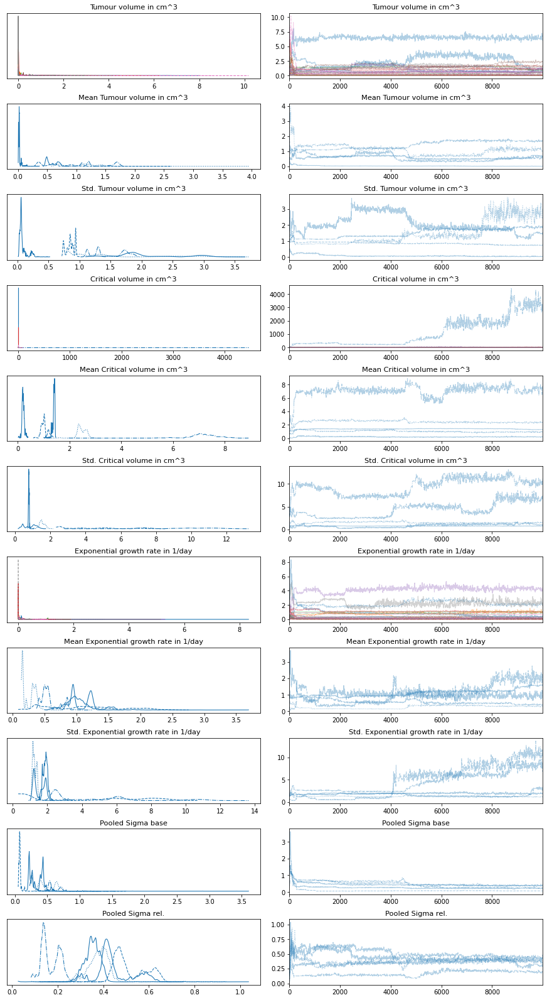

In [27]:
import arviz as az
import matplotlib.pyplot as plt

az.plot_trace(xarray_samples)
plt.show()

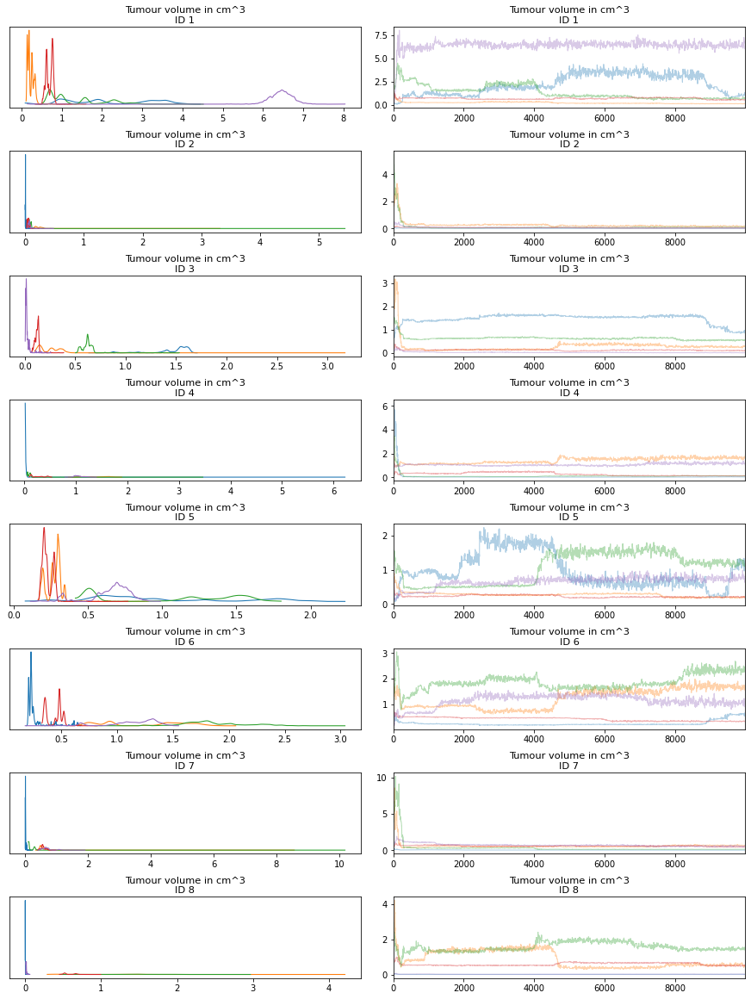

In [46]:
az.plot_trace(xarray_samples, var_names=['Tumour volume in cm^3'], compact=False)
plt.show()

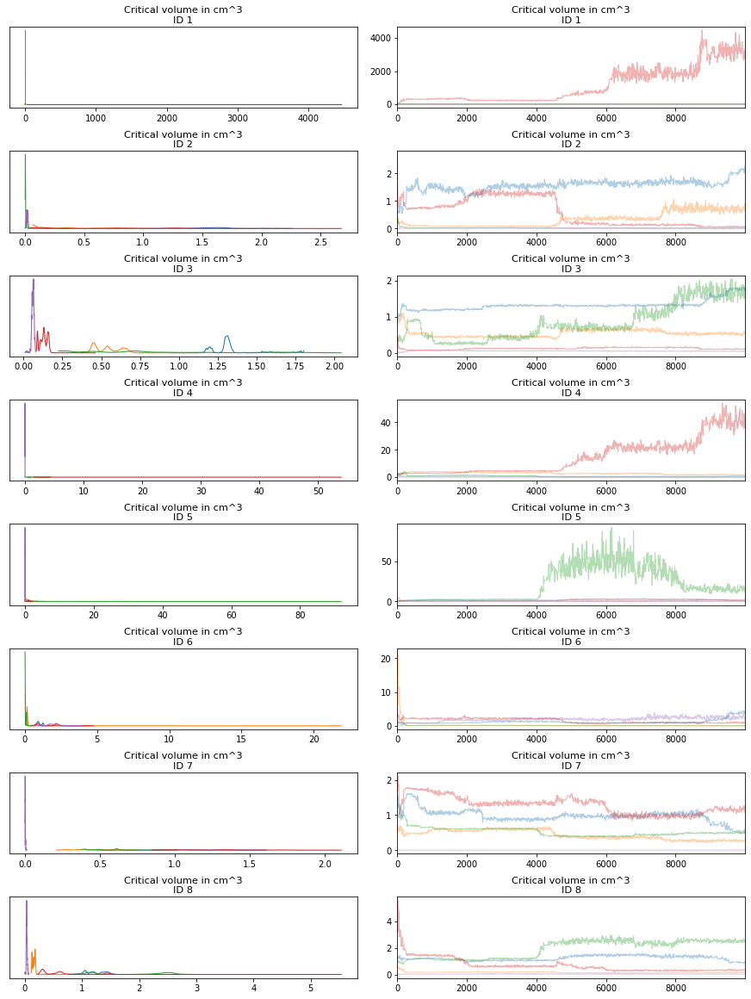

In [47]:
az.plot_trace(xarray_samples, var_names=['Critical volume in cm^3'], compact=False)
plt.show()

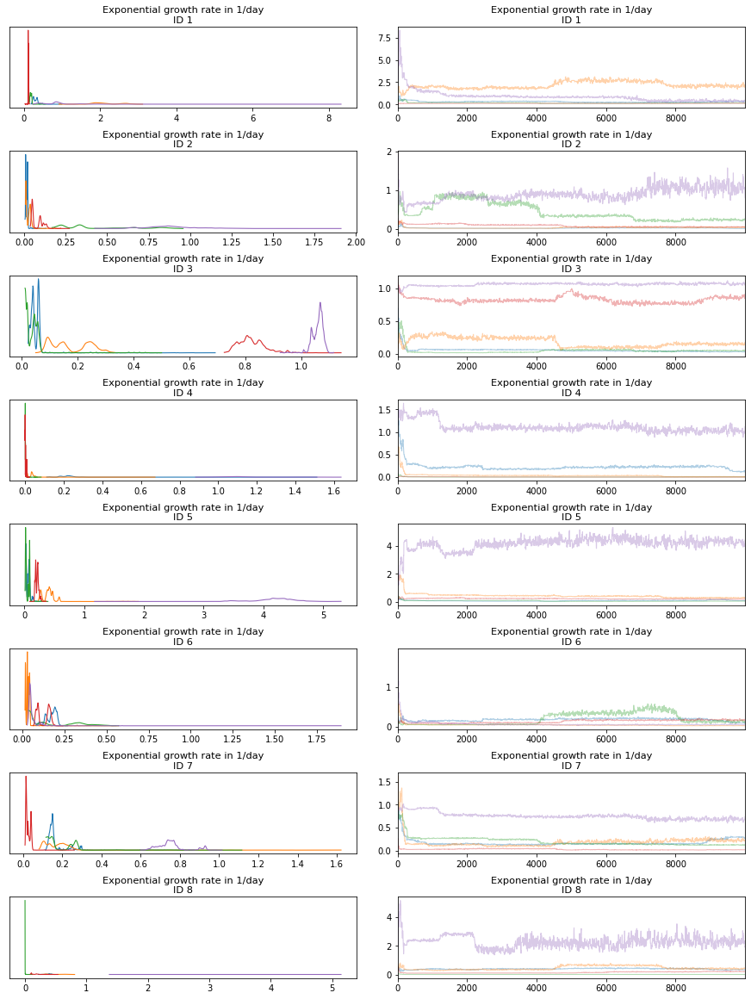

In [49]:
az.plot_trace(xarray_samples, var_names=['Exponential growth rate in 1/day'], compact=False)
plt.show()